# Introgression Mapping with Python

## Sergio Cruz

<img src='./Alliance_logo-COLOR.png' width='400' height=auto>

#  Introgression events

* Is the movement of a gene from one species into the gene pool of another

* Introgression is an important source of genetic variation in natural populations and may contribute to adaptation

* Introgressive hybridization has also been shown to be important in the evolution of domesticated crop species



<img src="./img/inbreed.svg"/>

# Ancestry Inference



* It might also help identifying the origin of introgressed variants underlying agricultural traits of interest (Burgarella et al. 2019)

* Support breeding strategies to produce improved hybrids








### Global Ancestry (GA)

* GA inference involves estimating the proportion of ancestry contributed by different populations averaged across the entire genome. Such methods have been applied to study population structure


<img src="./img/gancestry.PNG"/>

###  Local ancestry (LA) 

* In contrast, in LA inference, we interpret each chromosome in an individual’s genome as a mosaic of segments that originate from different ancestral populations and the goal is to find the ancestral population of origin at each position.

<img src="./img/lancestry.png"/>

# Local Ancestry 
* Most of the methods that have been developed so far take a generative approach to solve this and try to fit an explicit probabilistic model to the data using a hidden Markov model (HMM) or its extensions. Generative approaches for LA inference first try to model the joint dependence of alleles and ancestry and subsequently use “Bayes” rule to estimate the dependence of ancestry on SNP allele configurations


# Baye's Theorem

* In probability theory and statistics, Bayes' theorem (alternatively Bayes's theorem, Bayes's law or Bayes's rule) describes the probability of an event, based on prior knowledge of conditions that might be related to the event.

$$P(A|B) = \frac{P(B|A)P(A)}{P(B)}$$

* Where $A$ and $B$ are events and $P(B)\neq 0$
* $P(A|B)$ is a conditional probability: the likelihood of event $A$ occurring given that $B$ is true
* $P(B|A)$ is also a conditional probability: the likelihood of event $B$ occurring given that $A$ is true
* $P(A)$ and $P(B)$ are the probabilities of observing $A$ and $B$ respectively; they are known as the marginal probability.

# Example

* A factory produces an item using three machines—A, B, and C—which account for 20%, 30%, and 50% of its output, respectively. Of the items produced by machine A, 5% are defective; similarly, 3% of machine B's items and 1% of machine C's are defective. If a randomly selected item is defective, what is the probability it was produced by machine C? 



# Solution

* Let $X_i$ denote the event that a randomly chosen item was made by the i th machine (for i = A,B,C). Let $Y$ denote the event that a randomly chosen item is defective

$$\begin{equation*}P(X_A)=0.2\ P(X_B)=0.3\ P(X_C)=0.5\end{equation*}$$

$$\begin{equation*}P(Y|X_A) = 0.05\ P(Y|X_B)=0.03\
P(X_C)=0.01\end{equation*}$$

$$\begin{equation*}P(Y)=\sum P(Y|X_i)P(X_i) = 
(0.05)(0.2) + (0.03)(0.3) + (0.01)(0.5) = 0.024\end{equation*}$$

$$\begin{equation*}P(X_C|Y)=\frac{P(Y|X_C)P(X_C)}{P(Y)}=\frac{0.01 \cdot 0.50}{0.024} = \frac{5}{24}\end{equation*}$$



# Bayes' Theorem Approach

* Supose a loci A with two alleles $A_1$ and $A_2$
* Supose three populations $P_1,\ P_2,\ P_3$ each one with its own allelic frecuencies ($f_{Pi1},\ f_{Pi2}$) for the loci A
* Supose a sample of unknown origin with the loci A with genotype $A_1 A_1$
    
    Given the genotype $A_1 A_1$ we are interested in $P(P_1|A_1),\ P(P_2|A_1),\ P(P_3|A_1)$
    
    1. We need to compute the marginal probability $P(A_1)$:
    $$P(A_1)= \sum P(A_1|P_i)P(P_i)$$
    2. We compute the joint probability $P(P_i|A_1)$:
    $$\begin{equation*}P(P_i|A_1)=\frac{P(A_1|P_i)P(P_i)}{P(A_1)}\end{equation*}$$

In [1]:
import pandas as pd
import plotly.express as px
from collections import defaultdict
import re
import plotly.graph_objects as go

def NGSEPScraper(pathTable, fields):
    baseDf = pd.read_csv(pathTable, sep='\t', comment='#')
    for n, name in enumerate(fields):
        baseDf[name] = baseDf.apply(lambda row: getField(row, n), axis=1)
    return baseDf


def getField(row, field):
    data = row['All'].split(':')[field]
    return data
pop = pd.read_csv('./MIP_Building/snpdensity.snpden', sep='\t')
bigVCF = NGSEPScraper('./MIP_Building/outstats.txt', ['N', 'EHe', 'OHe', 'F-score', 'MAF', 'RAF', 'X2', 'CorrX2'])
bigVCF['MAF'] = bigVCF.MAF.astype(float)
#bigVCF = bigVCF[bigVCF['MAF']>0]

# The Data

* 3500 Samples GBS & WGS
* 59435 Sites
* Biallelic
* dp >=3
* imis 50


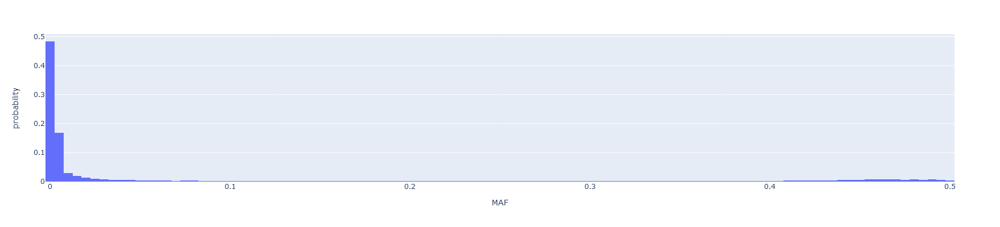

In [2]:
# maf histogram
fig  = px.histogram(bigVCF, x=bigVCF['MAF'], histnorm='probability',width=600, height=400)
fig.show()

# Marker Density 

* Windows of 100.000 bp
* Most of markers on telomeres
* Still the coverage represent the whole crhomosome


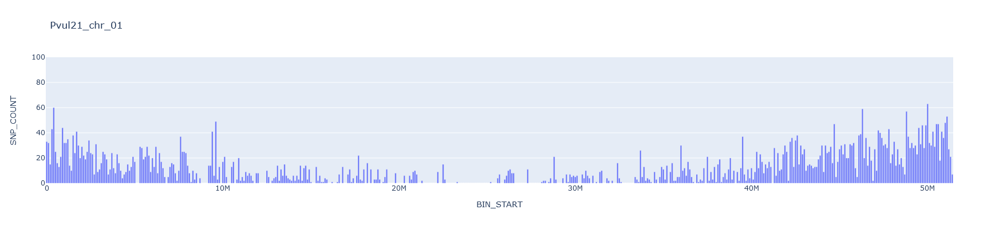

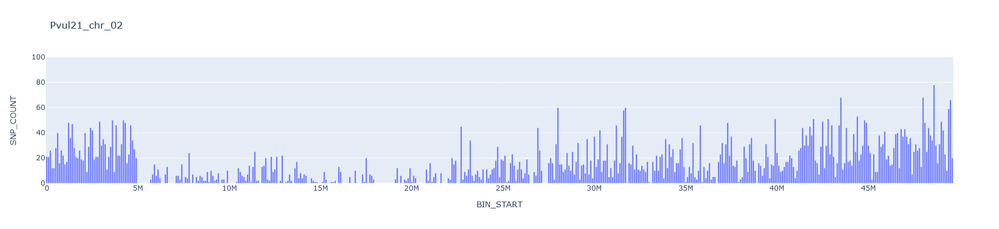

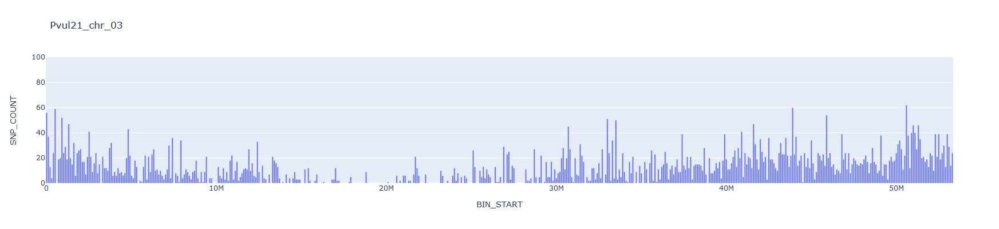

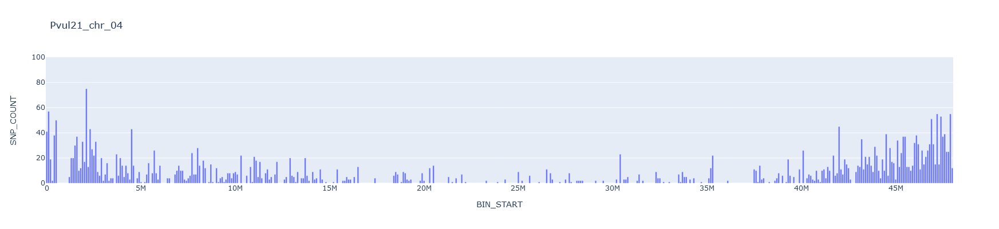

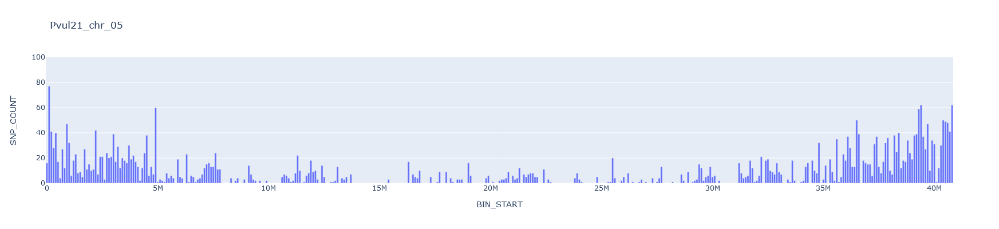

...

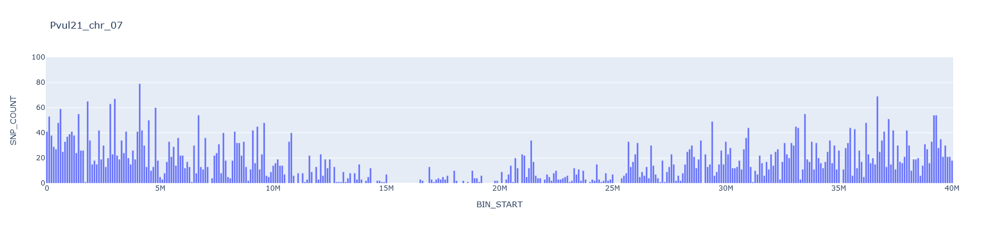

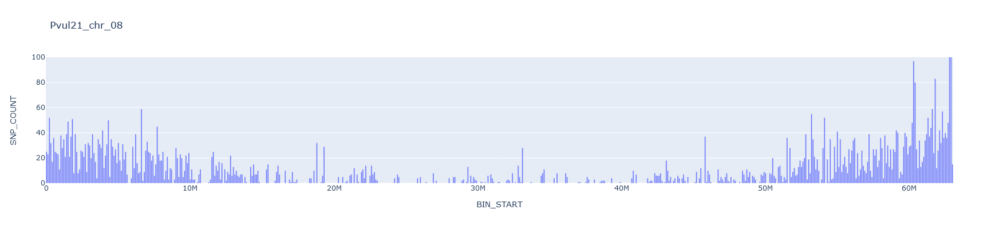

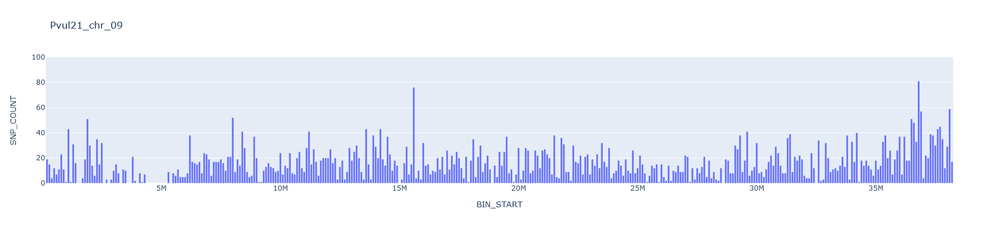

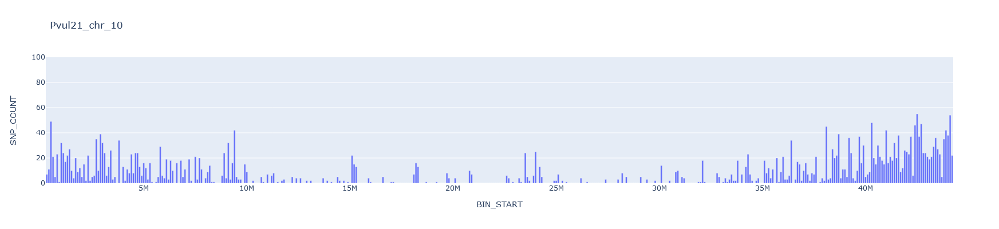

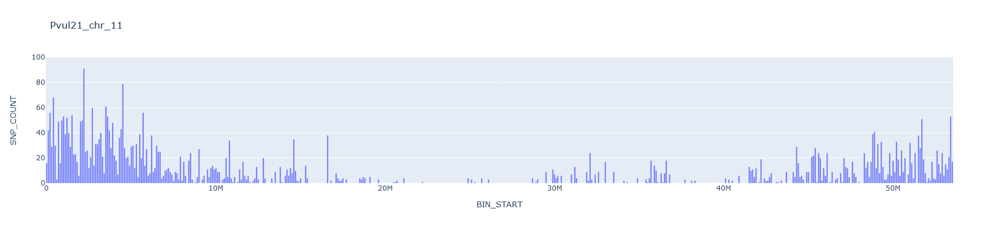

In [3]:
for chrom in pop.CHROM.unique():
    sdf = pop[pop['CHROM'] == chrom]
    fig = px.bar(sdf,'BIN_START', 'SNP_COUNT',width=500, height=400, title=chrom)
    fig.update_layout(yaxis=dict(range=[0,100]))
    fig.show()

In [13]:
import csv
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def getFreqs(pathFile):
    nsamples = defaultdict(list)
    MAF = defaultdict(dict)
    with open(pathFile, "r") as f:
        reader = csv.reader(f, delimiter="\t")
        for i, line in enumerate(reader):
            if i != 0:
                nsamples[line[0]].append(line[3])
                genotypes = line[4:]
                freqs = [[x.split(':')[0],float(x.split(':')[1])] for x in genotypes]
                MAF[line[0]][line[1]] = dict()
                for i in freqs:
                    if str(i[1]) == 'nan':
                        try:
                            del MAF[line[0]][line[1]]
                        except:
                            pass
                    else:
                        MAF[line[0]][line[1]][i[0]] = i[1]
    return MAF

class AlleleP:
    def __init__(self,allele, freqs, priorP=None):
        self.allele = allele
        self.freqs = [freq[self.allele] for freq in freqs]
        
        if priorP != None:
            self.priorP = priorP
        else:
            self.priorP = [1.0/len(freqs)] * len(freqs)
        self.P = self.getAlleleP()
        self.backgroundProbabilities = list()
        self.getBackgroundProbabilities()

        
    def getAlleleP(self):
        P = 0
        for freq, priorP in zip(self.freqs, self.priorP):
            P += freq*priorP    
        return P
    
    def getGroupPgivenAllele(self, freq, priorP):
        try:
            P = freq*priorP/self.P
        except ZeroDivisionError:
            P = 0
        return P
    def getBackgroundProbabilities(self):
        for freq, priorP in zip(self.freqs, self.priorP):
            Pbackground = self.getGroupPgivenAllele(freq, priorP)
            self.backgroundProbabilities.append(Pbackground)
        
        
def joinSnpsPos(keys):
    joinpositions = list()
    for positions in keys:
        joinpositions.extend(positions)
    out = list(set(joinpositions))
    return out

def initializeBackgroundP(freqs):
    groups = len(freqs)
    probs = defaultdict(dict)
    #chromosomes
    for chrom in freqs[0].keys():
        positions = [x[chrom].keys() for x in freqs]
        joinPositions = joinSnpsPos(positions)
        #snps
        for snp in joinPositions:            
            alleles = freqs[0][chrom][snp].keys()
            probs[chrom][snp] = dict()
            for allele in alleles:
                try:
                    ifrqs = [x[chrom][snp] for x in freqs]
                    if len(ifrqs) == groups:
                        probs[chrom][snp][allele] = AlleleP(allele, ifrqs)
                except:
                    try:
                        del probs[chrom][snp]
                    except:
                        pass
    return probs


coccFrq = getFreqs('./MIP_Building/Frequencies/GBS_WGS_CIAT_Coccineus.filt_info_dp3_mis50_het5_imis50.freq.frq')
acutFrq = getFreqs('./MIP_Building/Frequencies/out.frq')
vulFrq = getFreqs('./MIP_Building/Frequencies/GBS_WGS_CIAT_Vulgaris.filt_info_dp3_mis50_het5_imis50.freq.frq')
outP = initializeBackgroundP([vulFrq, coccFrq, acutFrq])
def prettyPrint(data):
    alleles = list(data.keys())
    freqs = [data[a].freqs for a in alleles]
    backgroundProbabilities = [data[a].backgroundProbabilities for a in alleles]
    marginal = [data[a].P for a in alleles]
    probs = pd.DataFrame()
    for n, allele in enumerate(alleles):
        probs['f '+allele] = freqs[n]
        probs['p '+allele+'| Pi'] = backgroundProbabilities[n]
    marginal.extend(['-','-'])
    probs.loc[-1] = marginal
    probs.index = ['Vulgaris', 'Coccineus', 'Acutifolius', 'P(Ai)']
    return probs

def getSimillarityMatrix(df, sample, backgrounds):
    similarity = pd.DataFrame(df[['CHROM', 'POS']])
    for haplotype in backgrounds:
        if haplotype != sample:
            similarity[haplotype] = (df[sample]==df[haplotype])
            similarity[haplotype].loc[df[haplotype].isnull()] = np.nan
            similarity[haplotype].loc[df[sample].isnull()] = np.nan
    similarity = similarity.replace(0,-1)
    similarity['GENPOS'] = df['GENPOS']
    return similarity


def changeScale(x):
    return 3*(x-(1/3.0))
   

def getWindowBackgroundInformativeness(window, sample):
    score = 0 
    for i, row in window.iterrows():
        if not pd.isnull(row[sample]):
            allele = row[sample].split('/')[0]
            try:
                backgroundProbs = outP[row['CHROM']][str(row['POS'])][allele].backgroundProbabilities
                for backgroundP in backgroundProbs[1:]:
                    score += backgroundP
            except:
                pass

    return score

def getWindowScores(window, sample):
    scores = list()
    unshared = 0
    for i, row in window.iterrows():
        if not pd.isnull(row[sample]):
            allele = row[sample].split('/')[0]
            try:
                backgroundProbs = np.array(outP[row['CHROM']][str(row['POS'])][allele].backgroundProbabilities)
                
                scores.append(backgroundProbs)
                
                
            except Exception as e:
                unshared += 1
    
    backgroundScores = np.array(scores).sum(axis=0)
    n = sum(backgroundScores)
    return backgroundScores/(n-unshared)


def sumMaximumSlidingWindow(df, step, threshold,sample):
    nSNP = df.shape[0]
    name = sample
    chrm = df.iloc[0].CHROM
    dfWindows = pd.DataFrame(columns=['CHROM','n','nSNP','p0','p1','Md_p','GENPOS','POS','pi', 'pf','pr1', 'pr2', 'pr3'])
    p0 = 0
    p1 = threshold 
    n = 0
    flag = False
    #print("%s: %s"%(chrm,nSNP))
    while  p1 < nSNP :
        p = 0
        while p <= threshold:
            if p1 < nSNP:
                wSampleAlleles =  df.iloc[p0:p1]
                try:
                    p = getWindowBackgroundInformativeness(wSampleAlleles, sample)
                
                except Exception  as e: 
                    #print(e)
                    pass
                p1 += 1
            else:
                flag = True
                break
        pr1,pr2,pr3 = getWindowScores(wSampleAlleles, sample)
        md_p= (p0+ p1)/2.0
        avGenPos =  wSampleAlleles['GENPOS'].mean()
        avPos =  wSampleAlleles['POS'].mean()
        nsnp =int(pr1 + pr2 + pr3)
        dfWindows.loc[len(dfWindows)] =  [chrm, n,nsnp,p0,p1,md_p,avGenPos,avPos,wSampleAlleles['POS'].min(),wSampleAlleles['POS'].max(), pr1, pr2, pr3]
        p0 += step
        p1 = p0 + threshold
        n += 1
        if flag:
            break
        
    return dfWindows
    
def getData(samples, reference):
    fields = ['CHROM', 'POS']
    fields.extend(samples)
    fields.extend(reference)
    df = pd.read_csv('./MIP_Building/common_GBS_WGS_CIAT_HeaderTA.filt_info_dp3_mis50_het5_imis50.vcf.gz', compression='gzip', usecols=fields, sep='\t')
    genPos = pd.read_csv('./MIP_Building/nMIP_Panel_filt_info_dp3_mis50_het5_imis50_GENPOS.map', sep='\t', header=None)
    genPos.columns = ['CHROM', 'POS', 'GENPOS']
    genPos['id'] = df.index
    df['id'] = df.index
    df = pd.merge(df, genPos[['GENPOS', 'id']], on='id')
    df = df.replace('./.', np.nan)
    return df



def MaximumSlidingWindows(samples, df, threshold, step):
    columns = samples
    itime = time.time()
    similarities = list()
    for chrom, chData in df.groupby('CHROM'):
        bychmom = pd.DataFrame()
        print(chrom)
        #hapData = hapData[~pd.isnull(hapData[haplotype])]       
        simChom = sumMaximumSlidingWindow(chData,step,threshold,samples[0])
        similarities.append(simChom)
    print(time.time() - itime)
    return(pd.concat(similarities))

def simulateWindows(df,sample,p0, p1):
    nSNP = df.shape[0]
    name = sample
    chrm = df.iloc[0].CHROM
    dfWindows = pd.DataFrame(columns=['CHROM','n','informativeness','p0','p1','Md_p','GENPOS','POS','pi', 'pf','pr1', 'pr2', 'pr3'])
    wSampleAlleles =  df.iloc[p0:p1]
    dontShared = 0
    try:
        p = getWindowBackgroundInformativeness(wSampleAlleles, sample)

    except Exception  as e: 
        print(e)
        dontShared += 1
        pass
    
    pr1,pr2,pr3 = getWindowScores(wSampleAlleles, sample)
    md_p= (p0+ p1-1)/2.0
    avGenPos =  wSampleAlleles['GENPOS'].mean()
    avPos =  wSampleAlleles['POS'].mean()
    nsnp =int(pr1 + pr2 + pr3)
    dfWindows.loc[len(dfWindows)] =  [chrm, (p1-p0)-dontShared,p,p0,p1-1,md_p,avGenPos,avPos,wSampleAlleles['POS'].min(),wSampleAlleles['POS'].max(), pr1, pr2, pr3]
    return dfWindows

# Build the groups: $P(A_{i}|P_{j})$

* Split the population into 3 groups: Vulgaris, Coccineus & Acutifolius

$$\begin{array}{cc}
\hline
Group & Size \\ 
\hline
Vulgaris & 3491 \\
Acutifolius & 5 \\
Coccineus & 4 \\
\end{array}$$

In [14]:
prettyPrint(outP['Pvul21_chr_02']['28102515'])

,f C,p C| Pi,f A,p A| Pi
Vulgaris,0.997606,0.374438,0.002394,0.00713
Coccineus,0.666667,0.250225,0.333333,0.99287
Acutifolius,1.000000,0.375337,0.0,0.0
P(Ai),0.888091,0.111909,-,-


In [6]:
samples = ['RRR_089-p14__GBS']
reference = ['G40001__WGS']
df = getData(samples,reference)
ch7 = df[df['CHROM'] == 'Pvul21_chr_06']
ch7 = ch7.dropna()
ch7 = ch7.reset_index(drop=True)
#out = sumMaximumSlidingWindow(ch7,step,threshold,samples[0])

def getWindowItertionData(p0, p1, df, sample):
    windows = list()
    for p1i in range(p0+1, p1):
        windows.append(simulateWindows(df, sample, p0, p1i))
    return pd.concat(windows)


def WindowIteration(p0,p1,df,sample):
    df = getWindowItertionData(p0, p1, df, sample)
    fig =plt.Figure(figsize=(10,7))
    ax = fig.add_subplot(211)
    ax2 = fig.add_subplot(212)
    ax.plot(df['GENPOS'],df['informativeness'])
    ax2.plot(df['GENPOS'],df['pr1'], label='Vulgaris')
    ax2.plot(df['GENPOS'],df['pr2'], label='Coccineus')
    ax2.plot(df['GENPOS'],df['pr3'], label='Acutifolius')
    ax2.legend()
    ax.plot([0,100],[10,10], color='r')
    ax.set_xlim((df['GENPOS'].min(),df['GENPOS'].max()))
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax2.set_xlabel('Genetic Position')
    ax2.set_ylabel('Window Probability')
    ax.set_ylabel('Informativeness Value')
    return fig
    
import ipywidgets as wg
from IPython.display import display
c_slide1 = wg.IntSlider(value=3200,
                        min=3200,
                        max=3245,
                        step=1,)
c_slide2 = wg.IntSlider(value=3222,
                        min=3205,
                        max=3245,
                        step=1,)

In [16]:
df.head()

,CHROM,POS,RRR_089-p14__GBS,G40001__WGS,id,GENPOS
0,Pvul21_chr_01,17888,NaN,T/C,0,0.000000
1,Pvul21_chr_01,18221,C/C,C/G,1,0.000019
2,Pvul21_chr_01,18228,T/T,T/G,2,0.000056
3,Pvul21_chr_01,18271,C/C,C/T,3,0.000059
4,Pvul21_chr_01,18325,G/C,C/C,4,0.000063


# Variable Slidding Size Windows


* Use a informativeness mesure and a threshold to stop the expansion of the window.
* If expect little foreign regions the informativeness value must maximize the probability of less frequent groups. 
* Reduce noise of signal

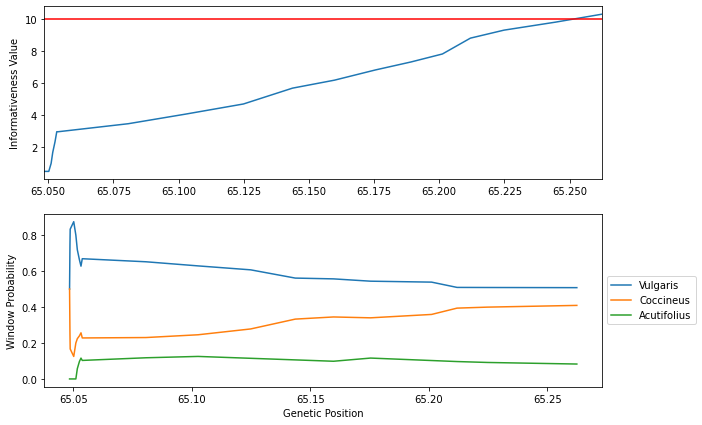

<function __main__.WindowIteration(p0, p1, df, sample)>

In [7]:

wg.interact(WindowIteration, p0=c_slide1, p1=c_slide2, df=wg.fixed(ch7),sample=wg.fixed(samples[0]))

In [8]:
import time 
from plotly.subplots import make_subplots
def PlotIntrgression(maxW, flag):

    fig = make_subplots(rows=11, cols=1,subplot_titles=(["CHROM %s" %x for x in range(1,12)]), shared_xaxes=True, shared_yaxes=False)
    chrom = 1
    for n,sdf in maxW.groupby('CHROM'):    
        fig.append_trace(go.Scatter(
            x=sdf['GENPOS'],
            y=sdf['pr1'],
            name = n,
            mode='lines',
            line = dict(color= "blue")
        ), row=chrom, col=1, )

        fig.append_trace(go.Scatter(
            x=sdf['GENPOS'],
            y=sdf['pr2'],
            name = n,
            mode='lines',
            line = dict(color = "red")
        ), row=chrom, col=1, )

        fig.append_trace(go.Scatter(
            x=sdf['GENPOS'],
            y=sdf['pr3'],
            mode='lines',
            name = n,
            line = dict(color = "green")
        ), row=chrom, col=1, )
        if flag:
            fig.add_trace(go.Scatter(x=sdf['GENPOS'], y=[1]*sdf.shape[0],
                    mode='markers',
                    name='lines', marker=dict(
                            size=4,
                            color=sdf['label'],
                            colorscale='Viridis', # one of plotly colorscales,
                            opacity=0.5
                            )), row=chrom, col=1,)

        #Introgression Mask
        chrom += 1

    fig.update_layout(height=2000, width=1000,
                      title_text="",
                      showlegend=False,
                         yaxis=dict( zeroline=True))
    fig.update_yaxes(range=[-0.2, 1.2])
    fig.show()

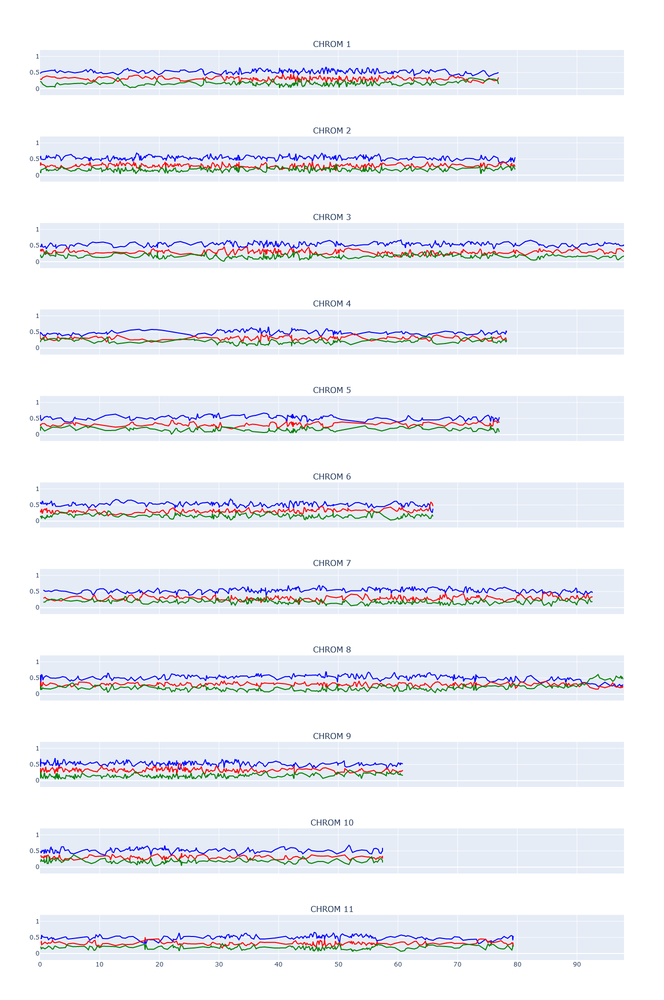

In [9]:
maxW = pd.read_csv('./MIP_Building/RRR_089-p14__GBS_hmm.csv')
PlotIntrgression(maxW, False)

# Hidden Markov Models

* A hidden Markov model (HMM) is a probabilistic graphical model that is commonly used in statistical pattern recognition and classification.

* Given just the observed data, estimate the model parameters.



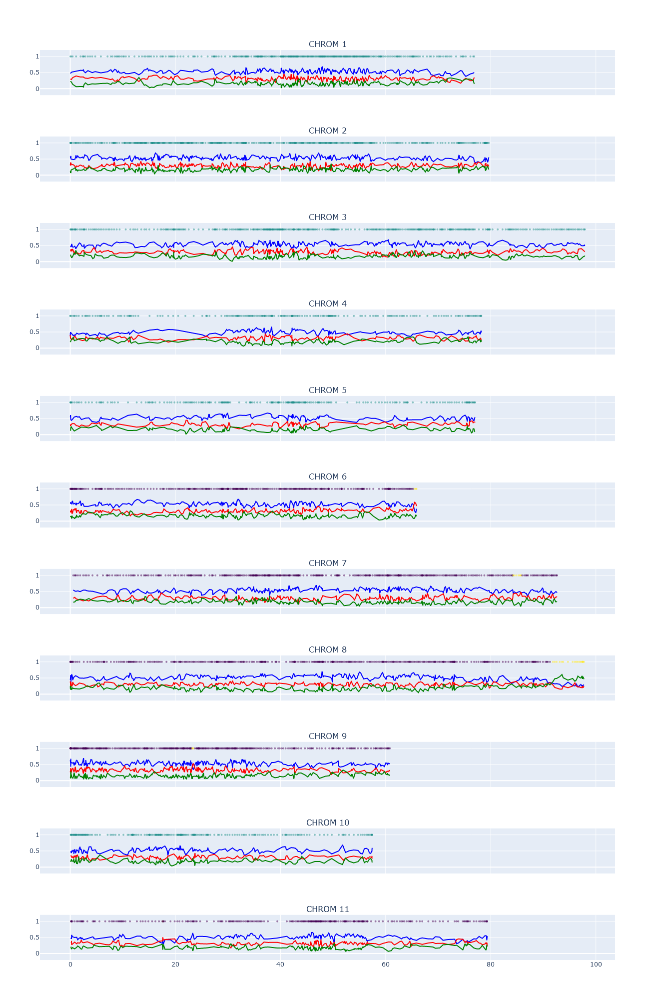

In [10]:
PlotIntrgression(maxW, True)

In [12]:
from hmmlearn import hmm
from sklearn.cluster import AgglomerativeClustering
def maskerhmm(df):
    out = list()
    for i, sdf in df.groupby(['CHROM']):
        model = hmmClassify(sdf[['pr1', 'pr2', 'pr3']], 3,verbose=False)
        X = sdf[['pr1', 'pr2', 'pr3']].to_numpy()
        
        labels = model.predict(X)
        out.extend(list(labels))
    return out

def hmmClassify(df, num_components, iterations=1000, num_samples = 1000,verbose=False):
    model = hmm.GaussianHMM(n_components=num_components, covariance_type="full",init_params='sc',params='sc')
    model.transmat_ = np.array([[9.93535040e-01, 6.20636152e-03, 2.58598397e-04],
       [5.85365854e-01, 4.14634146e-01, 0.00000000e+00],
       [5.55555556e-02, 0.00000000e+00, 9.44444444e-01]])
    model.means_ =  np.array([[0.6 , 0.3, 0.2], [0.5 , 0.6, 0.2], [0.4, 0.2, 0.6]])
    sampleName = df.columns[0]
    X = np.column_stack([df[['pr1', 'pr2', 'pr3']].to_numpy()])
    model.fit(X)
    if verbose:
        for i in range(model.n_components):
            print('Hidden State', i+1)
            print('Mean =', round(model.means_[i][0], 3))
            print('Variance =', round(np.diag(model.covars_[i])[0], 3))
            print('\n')
    #print(model.score(X))
    #return np.column_stack([domain, samples[:,0]])
    return model

x = maskerhmm(maxW)
maxW['mask'] = x
data = maxW[maxW['mask']!=0].copy()
introgressions = pd.DataFrame(columns=['CHROM','pi', 'pf', 'lp', 'gpi', 'gpf', 'lgp', 'nSNP', 'label'])
for background, sdf in data.groupby(['CHROM', 'mask']):
    clustering = AgglomerativeClustering(n_clusters=None, linkage='single',distance_threshold=5)
    X = sdf['GENPOS'].to_numpy().reshape(-1, 1)
    if X.shape != (1,1):
        out = clustering.fit(X)
        sdf['label'] = out.labels_
        
        for i, ssdf in sdf.groupby(['label']):
            chrom = ssdf['CHROM'].unique()
            pi = ssdf['pi'].min()
            pf = ssdf['pf'].max()
            lp = pf - pi
            gpi = ssdf['GENPOS'].min()
            gpf = ssdf['GENPOS'].max()
            lgp = gpf - gpi
            nSNP = (ssdf.shape[0]-1) * 10 + ssdf.iloc[-1]['nSNP']
            row = pd.Series({'CHROM':chrom[0],'pi':pi, 'pf':pf, 'lp':lp, 'gpi':gpi, 'gpf':gpf, 'lgp':lgp, 'nSNP':nSNP, 'label':background[1]} )
            introgressions = introgressions.append(row, ignore_index=True)

C:\Users\scruz\AppData\Local\Continuum\anaconda3\envs\presentaciones\lib\site-packages\ipykernel_launcher.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\scruz\AppData\Local\Continuum\anaconda3\envs\presentaciones\lib\site-packages\ipykernel_launcher.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\scruz\AppData\Local\Continuum\anaconda3\envs\presentaciones\lib\site-packages\ipykernel_launcher.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

In [13]:
introgressions

,CHROM,pi,pf,lp,gpi,gpf,lgp,nSNP,label
0,Pvul21_chr_06,31076873,31210602,133729,65.502787,65.868412,0.365625,21,1
1,Pvul21_chr_07,37725486,38169207,443721,84.256558,85.801676,1.545117,61,1
2,Pvul21_chr_08,62241347,63038015,796668,91.819891,97.737061,5.917169,171,2
3,Pvul21_chr_09,22307901,22620828,312927,23.222086,23.453498,0.231412,21,1


# Pvul21_chr_06

<img src="./img/CH6.png"/>


# Pvul21_chr_07	

<img src="./img/CH7.png"/>


# Pvul21_chr_08

<img src="./img/CH8.png"/>


# Pvul21_chr_09
<img src="./img/CH9.png"/>

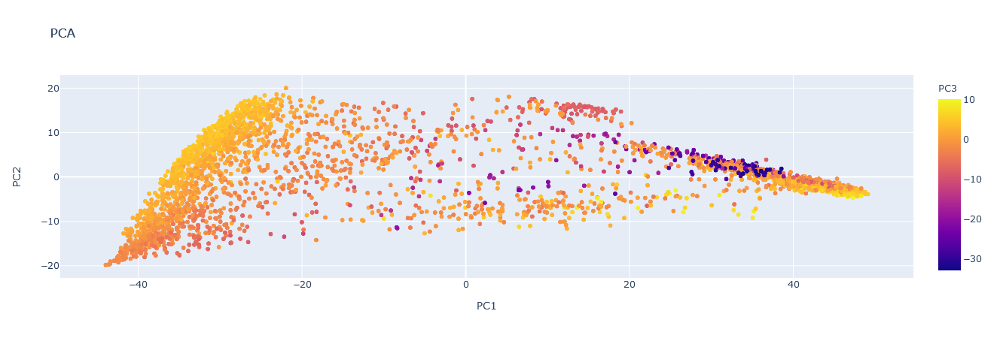

In [15]:
pca = pd.read_csv('MIP_Building/GBS_WGS_CIAT_Vulgaris1.txt', delimiter='\t')
fig = px.scatter(pca, x='PC1',y='PC2',hover_name='Taxa',title='PCA',color='PC3')
fig.show()

In [17]:
9.93535040e-01 + 6.20636152e-03 + 2.58598397e-04

0.9999999999170001

In [18]:
6.20636152e-03 + 2.58598397e-04

0.006464959917

In [19]:
4.14634146e-01+ 0.00000000e+00

0.414634146

In [20]:
 9.44444444e-01

0.944444444